# 三维剖面绘制
根据速度模型和地震定位结果绘制三维空间分布。在处理过程使用xarray数据结构提取数据切片，其他处理python和PyGMT共同实现。

In [171]:
import pandas as pd 
import pygmt
import numpy as np 
import  xarray as xr

In [172]:
# read model and convert to xarray
# the model:https://github.com/ShouchengHan/USTClitho2.0/blob/main/USTClitho2.0.wrst.sea_level.txt
velocity = pd.read_csv('USTClitho2.0.wrst.sea_level.txt',sep='\s+',names=['longitude','latitude','depth','vp','vs'])
velocity = velocity.set_index(['latitude','longitude','depth'])
USTClitho2 = xr.Dataset.from_dataframe(velocity)
#USTClitho2.vp.sel(depth=20).plot(cmap='jet_r')

In [173]:
# 读取地震目录
# http://cses.ac.cn/sjcp/ggmx/2021/132.shtml 中国地震科学实验场-重新定位地震目录
names = ['year','month','day','hour','minute','second','latitude','longitude','depth','magnitude']
catalog = pd.read_csv('http://cses.ac.cn/wp-content/uploads/2020/01/cata2019.txt',sep='\s+',names=names)
catalog

,year,month,day,hour,minute,second,latitude,longitude,depth,magnitude
0,2009,1,1,0,1,23.33,37.540833,95.807000,0.050,2.7
1,2009,1,1,0,26,11.86,26.212452,101.914650,9.619,2.2
2,2009,1,1,0,55,54.41,32.828598,103.748474,5.795,1.5
3,2009,1,1,1,2,16.66,30.873333,99.822000,8.180,1.6
4,2009,1,1,2,49,5.10,31.272087,103.153648,0.322,2.2
...,...,...,...,...,...,...,...,...,...,...
127004,2019,5,21,2,58,48.33,34.155205,96.754059,4.920,2.0
127005,2019,5,21,17,19,8.54,37.059833,97.603167,9.070,1.5
127006,2019,5,22,14,4,16.28,33.033000,94.629667,0.080,3.3
127007,2019,5,22,19,22,0.12,38.896278,99.810669,8.814,1.6


In [174]:
# 定义绘图范围
# cut the model to region
region = [97,107,21,34,0,80]
lon1,lon2,lat1,lat2,dep1,dep2 = region
model = USTClitho2.where((USTClitho2.longitude >= lon1) & (USTClitho2.longitude <= lon2) & (USTClitho2.latitude >= lat1) & (USTClitho2.latitude <= lat2),drop=True)

# interpretation the model to 0.02*0.02*1
lons = np.arange(lon1,lon2+0.01,0.02)
lats = np.arange(lat1,lat2+0.01,0.02)
deps = np.arange(dep1,dep2+0.01,1)
model = model.interp(longitude=lons,latitude=lats,depth=deps)
model

<xarray.Dataset>
Dimensions:    (latitude: 651, longitude: 501, depth: 81)
Coordinates:
  * longitude  (longitude) float64 97.0 97.02 97.04 97.06 ... 107.0 107.0 107.0
  * latitude   (latitude) float64 21.0 21.02 21.04 21.06 ... 33.96 33.98 34.0
  * depth      (depth) float64 0.0 1.0 2.0 3.0 4.0 ... 76.0 77.0 78.0 79.0 80.0
Data variables:
    vp         (latitude, longitude, depth) float64 4.5 4.659 ... 8.108 8.105
    vs         (latitude, longitude, depth) float64 2.66 2.756 ... 4.539 4.535

In [175]:
# get the topography
topo = pygmt.datasets.load_earth_relief(resolution='01m',region=region)
topo = -1*topo/1000 # convert m to km
clon,clat = 102,28
index = (topo.lon >= clon ) & (topo.lon <= lon2) & (topo.lat <= clat) & (topo.lat >= lat1)
ele = topo.where(~index)
ele.data = ele.data

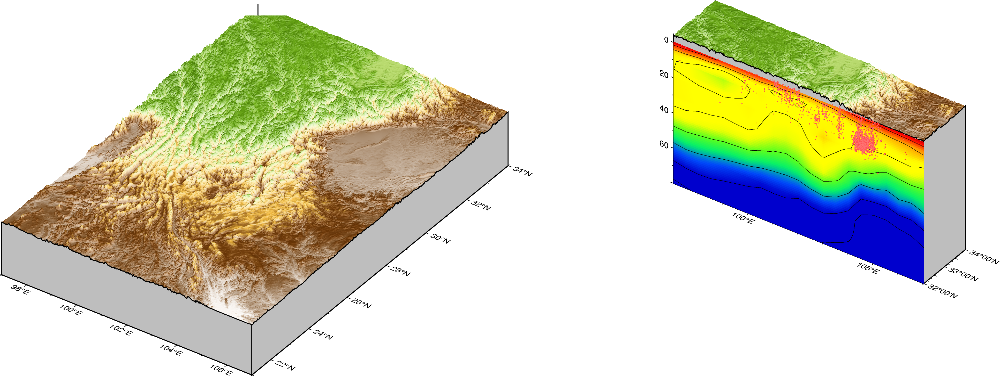

In [176]:
# 绘制模型
azimuth = 145
elevation = 35
pz='{}/{}'.format(azimuth,elevation)

fig = pygmt.Figure()
pygmt.config(MAP_FRAME_TYPE='plain',FONT='9p',MAP_FRAME_PEN='0.5p')
fig.basemap(region=[97,107,21,34,0,20],projection='M10c',zsize='-2c',frame=['xa2f1','ya2f1','wSEnZ'],perspective='z'+pz)
pygmt.grd2cpt(grid=topo,cmap='dem1',output='dem.cpt',continuous=True)
fig.grdview(grid=topo,cmap='dem.cpt',shading=True,surftype='i',plane='20+ggray',perspective=True)

# 提取对应纬度的剖面
plane = '80+ggray'
frame = ['xaf','yaf','zaf','wSEnZ']
pygmt.makecpt(cmap='seis',series=[4.5,7.5,0.1],continuous=True,background=True,output='depth.cpt')
PA = [97,107,32,34,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where(topo.lat >= lat1,drop=True)
fig.shift_origin(xshift='22c',yshift='3c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)

# 绘制速度剖面
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)

# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
fig.show()

In [177]:
# 同理绘制其他剖面
PA = [97,107,30,32,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where((topo.lat >= lat1 ) & (topo.lat <=lat2),drop=True)
fig.shift_origin(xshift='-4c',yshift='-4c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)
# 提取速度模型
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)
# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
#fig.show()

In [178]:
PA = [97,107,28,30,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where((topo.lat >= lat1 ) & (topo.lat <=lat2),drop=True)
fig.shift_origin(xshift='-4c',yshift='-4c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)
# 提取速度模型
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)
# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
#fig.show()

In [179]:
PA = [97,107,26,28,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where((topo.lat >= lat1 ) & (topo.lat <=lat2),drop=True)
fig.shift_origin(xshift='-4c',yshift='-4c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)
# 提取速度模型
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)
# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
#fig.show()

In [180]:
PA = [97,107,24,26,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where((topo.lat >= lat1 ) & (topo.lat <=lat2),drop=True)
fig.shift_origin(xshift='-4c',yshift='-4c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)
# 提取速度模型
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)
# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
#fig.show()

In [181]:
PA = [97,107,22,24,-5,80]
lon1,lon2,lat1,lat2,dep1,dep2 = PA
gridA = topo.where((topo.lat >= lat1 ) & (topo.lat <=lat2),drop=True)
fig.shift_origin(xshift='-4c',yshift='-4c')
fig.basemap(region=PA,projection='M10c',zsize='-6c',frame=frame,perspective='z'+pz)
fig.grdview(grid=gridA,surftype='i',plane=plane,shading=True,cmap='dem.cpt',perspective=True)
# 提取速度模型
xz = model.vp.sel(latitude=lat1,method='nearest')
rxz = [lon1,lon2,dep1,dep2,lat1,lat2]
fig.grdimage(grid=xz.transpose(),cmap='depth.cpt',region=rxz,projection=['X{}c/-{}c'.format(10,6),'Z{}c'.format(10)],perspective='y'+pz+'/{}'.format(lat1))
fig.grdcontour(grid=xz.transpose(),perspective=True,interval=0.5)
# 叠加地震剖面
data = catalog[['longitude','latitude','depth','magnitude']]
track = pygmt.project(data=data,center=[lon1,lat1],endpoint=[lon2,lat1],width=[-20,20],unit=True)
track = track.rename(columns={0:'longitude',1:'latitude',2:'depth',3:'magnitude',4:'p',5:'q',6:'r',7:'s'})
fig.plot3d(region=PA,projection='M10c',zsize='-6c',x=track.r,y=track.s,z=track.depth,style='uc',size=0.01*track.magnitude,fill='red',perspective='z'+pz)
fig.colorbar(cmap='depth.cpt',frame=['xaf+lP-wave velocity','y+lkm/s'],perspective=True)
#fig.show()

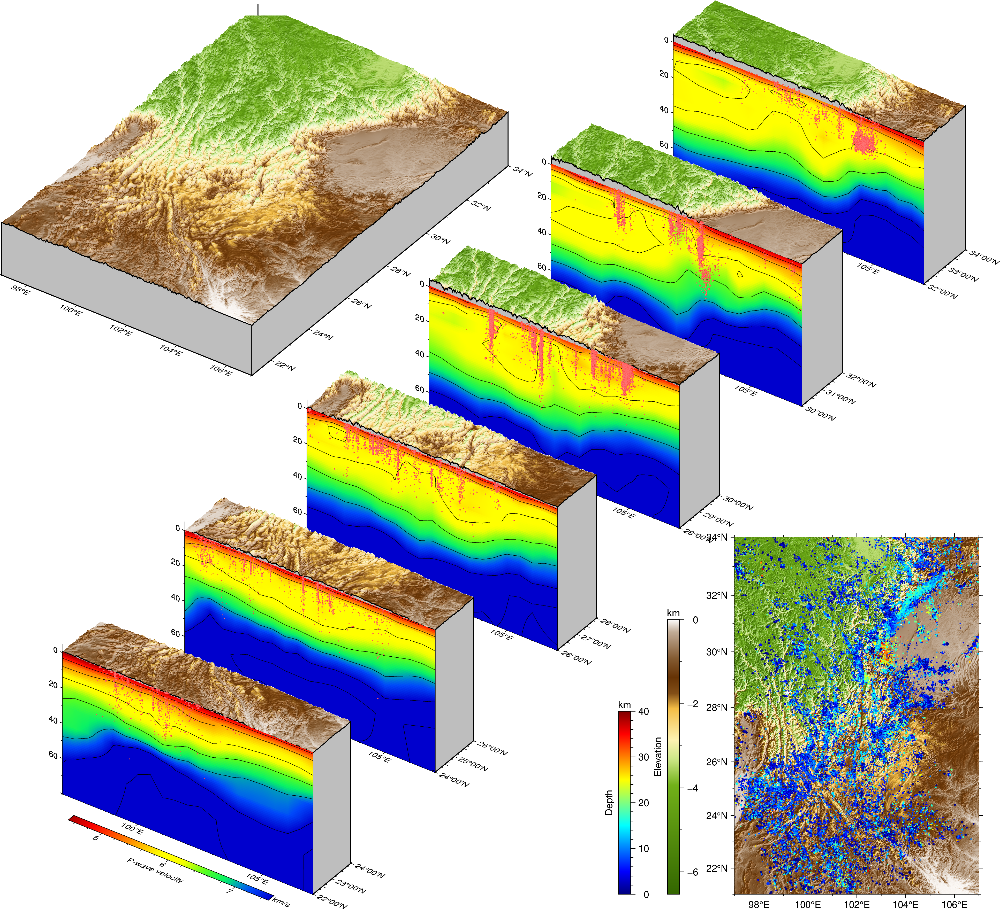

In [182]:
fig.shift_origin(xshift='22c')
fig.basemap(region=region,projection='M8c',frame=['xa2f1','ya2f1','WSen'])
fig.grdimage(grid=topo,cmap='dem.cpt',shading=True)
pygmt.makecpt(cmap='jet',series=[0,40,1],continuous=True)
fig.plot(x=catalog.longitude,y=catalog.latitude,style='cc',size=0.02*catalog.magnitude,fill=catalog.depth,cmap=True)
fig.colorbar(position='jBL+w6c/0.4c+o-3.8c/0c+ml',frame=['xaf+lDepth','y+lkm'],cmap=True)
fig.colorbar(position='jBL+w9c/0.4c+o-2.2c/0c+ml',frame=['xaf+lElevation','y+lkm'],cmap='dem.cpt')
fig.show()